In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt

import os
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


import folium
from folium.plugins import FastMarkerCluster
import geopandas as gpd
from branca.colormap import LinearColormap


import plotly.graph_objs as go
import chart_studio.plotly  as py
from plotly.offline import iplot, init_notebook_mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)


from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import re
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from wordcloud import WordCloud

In [3]:
df = pd.read_csv('./Data/data_Tasmania.csv')

In [4]:
df.head()

,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price_x,minimum_nights,number_of_reviews,...,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,listing_url,host_is_superhost,host_about,host_response_time,host_response_rate,price_y
0,Central Hobart Historic Cottage,153268,Yvette,Hobart,-42.87895,147.31526,Private room,214.2,1,255,...,4.96,4.96,4.82,7,https://www.airbnb.com/rooms/35644,t,I am an adjunct Senior Lecturer at the School ...,within an hour,100.0,NaN
1,Kentisbury Country House Cradle Coast Tasmania,461471,Melissa,Kentish,-41.38892,146.23196,Entire home/apt,299.0,2,135,...,4.98,4.98,4.98,90,https://www.airbnb.com/rooms/84581,t,"Life revolves around family, food and operatin...",within an hour,100.0,$299.00
2,Terrace- 5mins to central Hobart,485048,Russell And Ingrid,Hobart,-42.88219,147.32253,Entire home/apt,125.0,2,617,...,4.87,4.93,4.67,365,https://www.airbnb.com/rooms/88873,t,We're Russell and Ingrid.\r\nIngrid is a schoo...,within an hour,100.0,$125.00
3,Bradman House CBD Launceston Invermay + Free WIFI,673625,Emma And Dale,Launceston,-41.42548,147.12855,Entire home/apt,239.0,1,412,...,4.68,4.82,4.53,1125,https://www.airbnb.com/rooms/137808,f,NaN,within an hour,100.0,$239.00
4,Cosy Cabin @ Eagles Rise - Cradle Mountain 1 hour,1090010,Kit,Central Coast,-41.23440,146.13398,Entire home/apt,110.0,2,81,...,4.95,4.91,4.91,7,https://www.airbnb.com/rooms/252996,t,"From London originally, now living here in Tas...",within an hour,100.0,$110.00


<div align="center">

### **E.D.A** 

</div>

# Neighbourhoods - Numero de Alojamientos 


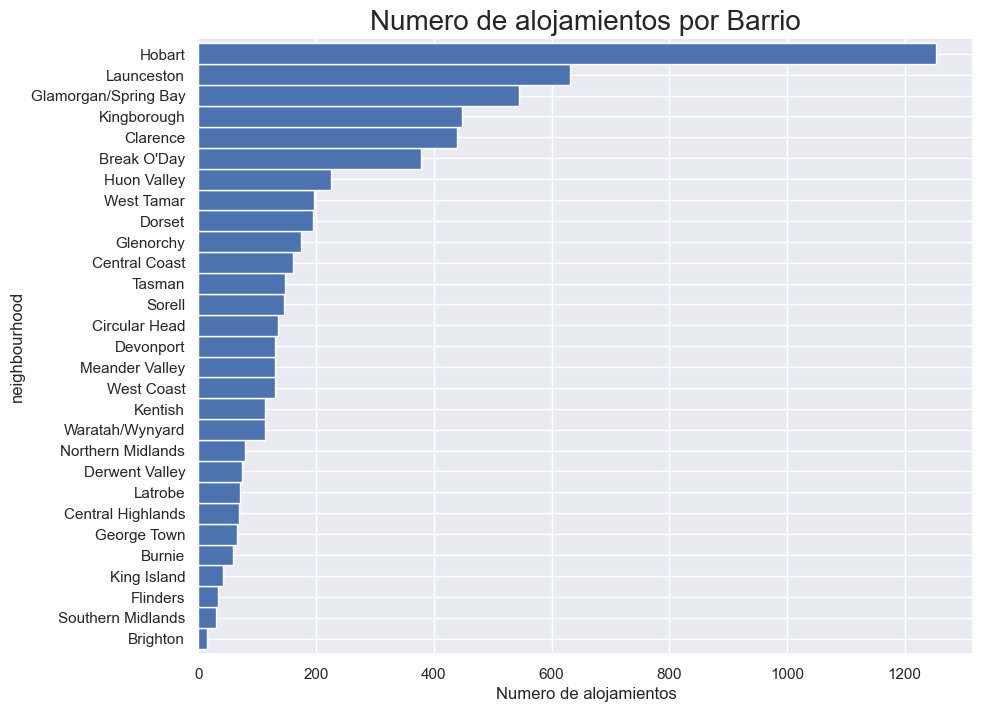

In [5]:
freq = df['neighbourhood'].value_counts().sort_values(ascending=True)
freq.plot.barh(figsize=(10, 8), color='b', width=1)
plt.title("Numero de alojamientos por Barrio", fontsize=20)
plt.xlabel('Numero de alojamientos', fontsize=12)
plt.show()



# Mapa Interactivo con Clúster de Marcadores

In [6]:
lats2018 = df['latitude'].tolist()
lons2018 = df['longitude'].tolist()
locations = list(zip(lats2018, lons2018))

map1 = folium.Map(location=[-42.0409, 146.8087], zoom_start=7)
FastMarkerCluster(data=locations).add_to(map1)
map1

# Media de Precio por Barrio 

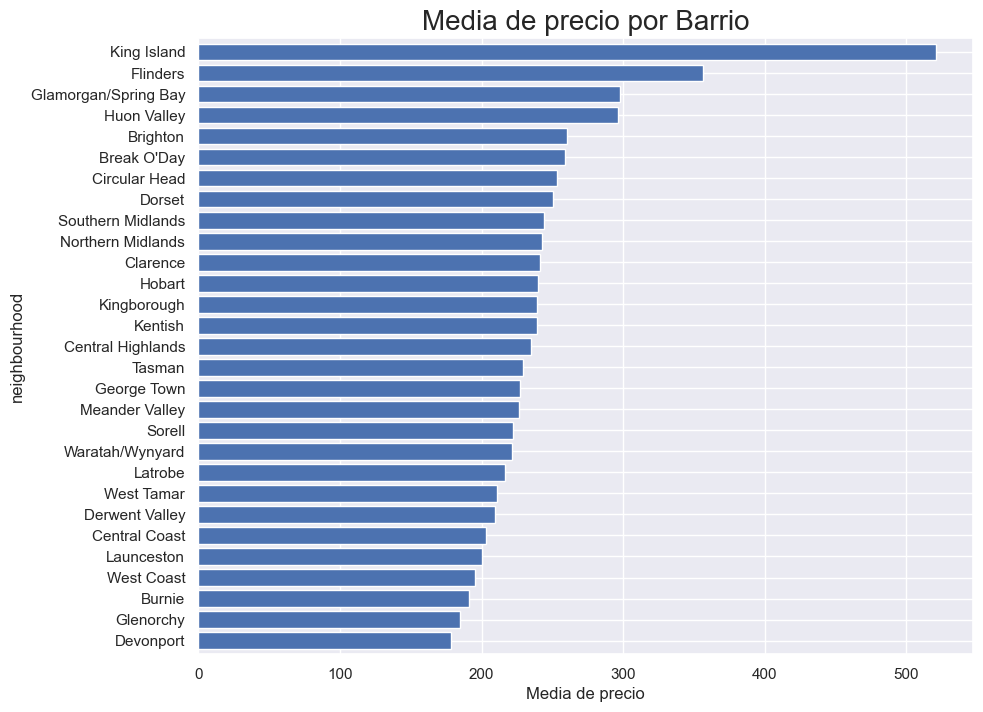

In [7]:
mean_price_per_neighbourhood = df.groupby('neighbourhood')['price_x'].mean().sort_values(ascending=True)
mean_price_per_neighbourhood.plot.barh(figsize=(10, 8), color='b', width=0.8)
plt.title("Media de precio por Barrio", fontsize=20)
plt.xlabel('Media de precio', fontsize=12)
plt.show()

# Mapa de Barrios por categoria de Precio

In [8]:
df['price_category'] = pd.qcut(df['price_x'], q=3, labels=['Low', 'Medium', 'High'])
df[['neighbourhood', 'price_x', 'price_category']].head()

,neighbourhood,price_x,price_category
0,Hobart,214.2,Medium
1,Kentish,299.0,High
2,Hobart,125.0,Low
3,Launceston,239.0,Medium
4,Central Coast,110.0,Low


In [9]:
df['price_category'] = pd.Categorical(df['price_category'], categories=['Low', 'Medium', 'High'], ordered=True)
df['price_category_code'] = df['price_category'].cat.codes


map2 = folium.Map(location=[-42.0409, 146.8087], zoom_start=7)
colormap = LinearColormap(colors=['green', 'yellow', 'red'], vmin=0, vmax=2, caption='Price Category')
colormap = colormap.to_step(index=[0, 1, 2])

for idx, row in df.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=5,
        color=colormap(row['price_category_code']),
        fill=True,
        fill_color=colormap(row['price_category_code']),
        fill_opacity=0.7,
        popup=f"Neighbourhood: {row['neighbourhood']}<br>Price Category: {row['price_category']}"
    ).add_to(map2)

colormap.add_to(map2)

map2

# 1. Hobart: El Primer Lugar que Ver en Tasmania

Pequeña pero cosmopolita, la capital es siempre una parada obligatoria en cualquier visita a Tasmania, pues el aeropuerto de Hobart es el principal acceso a la isla.

Fundada en 1803, junto al mar y a los pies del Mount Wellington, que tiene unos 1270 metros de altura, ofrece desde sus miradores las mejores vistas a Hobart. Puedes llegar con tu coche o con este autobús desde el centro.

En Hobart se encuentran muchos de los lugares más históricos e importantes que ver en Tasmania:

- **Salamanca Place**: Antigua zona industrial rodeada de jardines, es el corazón comercial de la ciudad y cada sábado hospeda el principal mercado de la isla.
- **Battery Point**: Detrás de Salamanca Place, es un barrio tranquilo y con encanto gracias a sus casitas, jardines y cafés.
- **Puerto de Hobart**: Ideal para pasear, su principal muelle es Constitution Dock.
- **Museum of Old and New Art (MONA)**: Famoso por sus colecciones provocadoras y atractivas, es el mejor museo que visitar en Tasmania. A unos 12 kilómetros del centro, se puede llegar en barco desde el puerto.
- **Cascades Female Factory**: Antigua fábrica donde trabajaron convictas entre 1828 y 1856. Cerca está la cervecería más antigua de Australia, donde se sigue produciendo la Cascade.


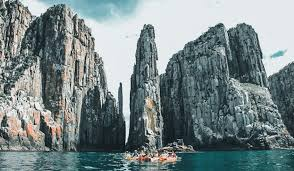

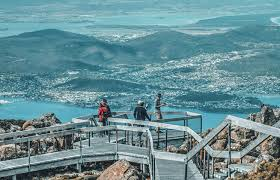

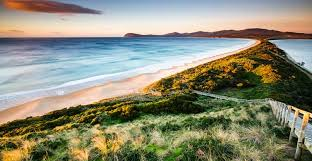

In [ ]:
from IPython.display import display, Image

img1 = Image(filename=r'')
img2 = Image(filename=r'')
img3 = Image(filename=r'')

display(img1, img2, img3)

# **HOBART** 

In [11]:
total_accommodations_hobart = df[df['neighbourhood'] == 'Hobart'].shape[0]
print(f"Total number of accommodations in Hobart: {total_accommodations_hobart}")

Total number of accommodations in Hobart: 1254


#### Total de alojamientos en Hovart segun su Tipo

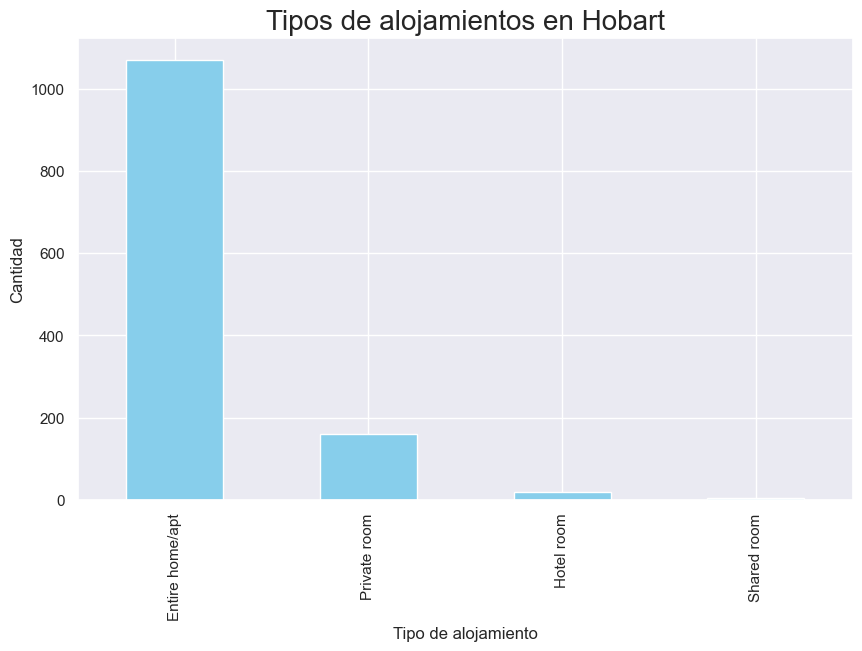

In [13]:
hobart_df = df[df['neighbourhood'] == 'Hobart']
accommodation_types = hobart_df['room_type'].value_counts()

accommodation_types.plot(kind='bar', figsize=(10, 6), color='skyblue')
plt.title('Tipos de alojamientos en Hobart', fontsize=20)
plt.xlabel('Tipo de alojamiento', fontsize=12)
plt.ylabel('Cantidad', fontsize=12)
plt.show()

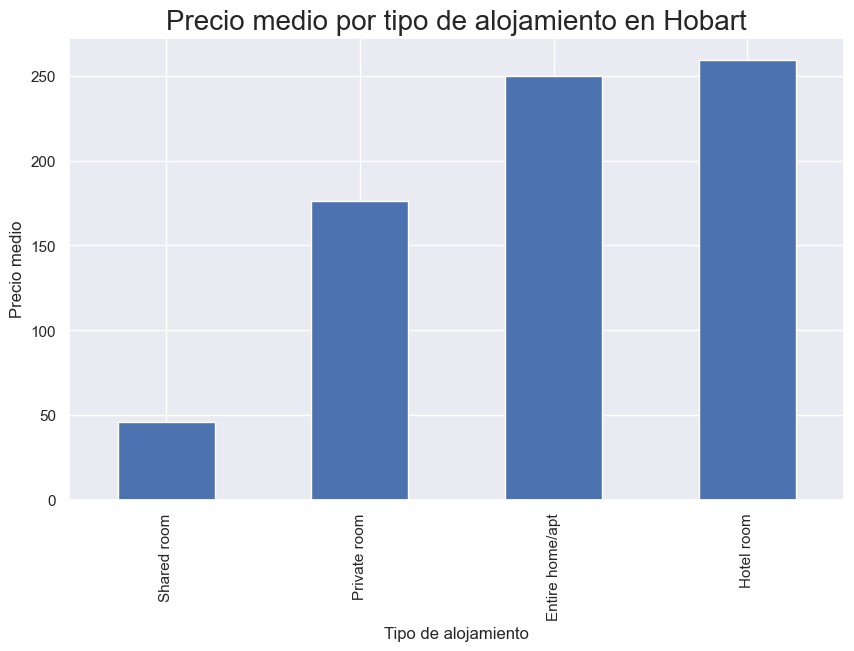

In [14]:
average_price_accommodation_type = hobart_df.groupby('room_type')['price_x'].mean().sort_values(ascending=True)
average_price_accommodation_type.plot(kind='bar', figsize=(10, 6), color='b')
plt.title('Precio medio por tipo de alojamiento en Hobart', fontsize=20)
plt.xlabel('Tipo de alojamiento', fontsize=12)
plt.ylabel('Precio medio', fontsize=12)
plt.show()

# Mapa de Hobart por rango de precios y capacidad

In [25]:
hobart_df = df[df['neighbourhood'] == 'Hobart']

map_hobart = folium.Map(location=[-42.8821, 147.3272], zoom_start=12)
colormap = LinearColormap(colors=['green', 'yellow', 'red'], vmin=0, vmax=2, caption='Price Category')
colormap = colormap.to_step(index=[0, 1, 2])

for idx, row in hobart_df.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=5,
        color=colormap(row['price_category_code']),
        fill=True,
        fill_color=colormap(row['price_category_code']),
        fill_opacity=0.7,
        popup=f"Price: {row['price_x']}<br>Price Category: {row['price_category']}<br>Capacity: {row['accommodates']}"
    ).add_to(map_hobart)

colormap.add_to(map_hobart)

map_hobart

# Precio Medio por Tipo de Alojamiento y Capacidad en Hobart

En la siguiente gráfica se muestra el precio medio de los alojamientos en Hobart, clasificados por tipo de habitación y capacidad. La capacidad se refiere al número de personas que el alojamiento puede acomodar. Los precios están segmentados en tres categorías: Bajo, Medio y Alto. Esta visualización nos permite entender cómo varía el precio en función del tipo de alojamiento y su capacidad.

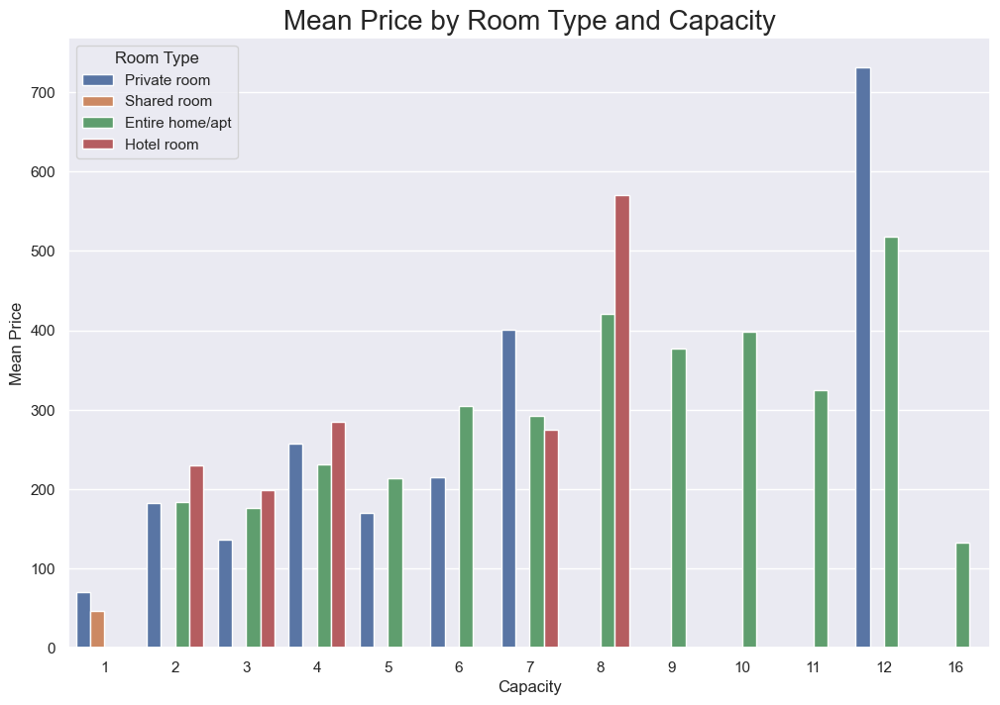

In [27]:
accommodation_capacity_price = hobart_df.groupby(['room_type', 'accommodates'])['price_x'].mean().reset_index()

accommodation_capacity_price['price_range'] = pd.qcut(accommodation_capacity_price['price_x'], q=3, labels=['Low', 'Medium', 'High'])
accommodation_capacity_price.head()


plt.figure(figsize=(12, 8))
sns.barplot(data=accommodation_capacity_price, x='accommodates', y='price_x', hue='room_type')
plt.title('Mean Price by Room Type and Capacity', fontsize=20)
plt.xlabel('Capacity', fontsize=12)
plt.ylabel('Mean Price', fontsize=12)
plt.legend(title='Room Type')
plt.show()

# Rango medio de ocupacion y beneficios anuales


In [17]:
hobart_df['occupancy_rate'] = 1 - (hobart_df['availability_365'] / 365)
average_occupancy_rate = hobart_df['occupancy_rate'].mean()
print(f"El índice de ocupación promedio de los alojamientos en Hobart es: {average_occupancy_rate:.2%}")

El índice de ocupación promedio de los alojamientos en Hobart es: 57.26%


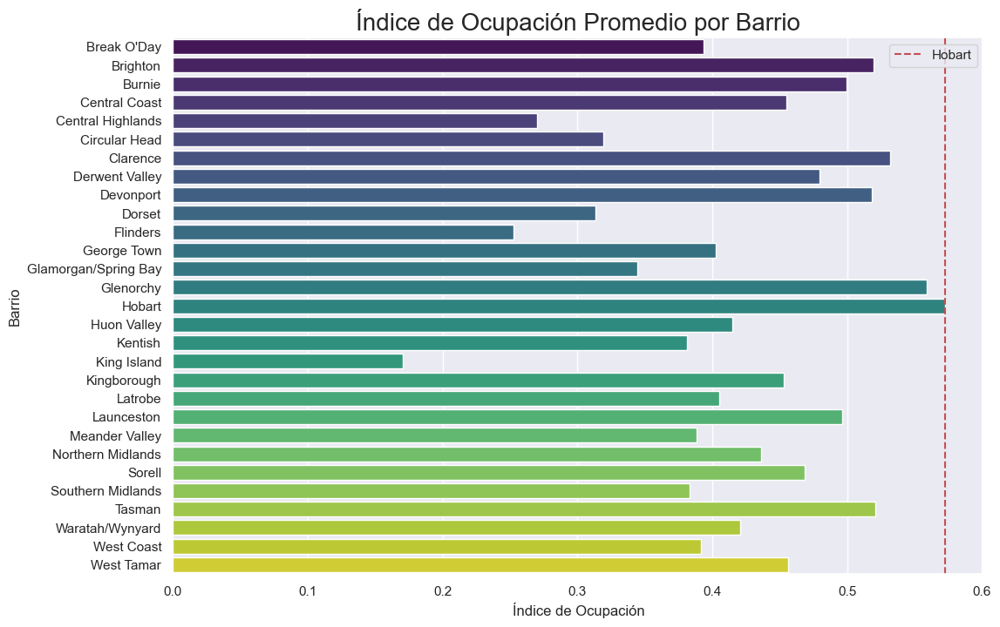

In [ ]:
df['occupancy_rate'] = 1 - (df['availability_365'] / 365)
average_occupancy_rate_neighbourhood = df.groupby('neighbourhood')['occupancy_rate'].mean().reset_index()

# Graficar el índice de ocupación promedio por barrio
plt.figure(figsize=(12, 8))
sns.barplot(data=average_occupancy_rate_neighbourhood, x='occupancy_rate', y='neighbourhood', palette='viridis')
plt.title('Índice de Ocupación Promedio por Barrio', fontsize=20)
plt.xlabel('Índice de Ocupación', fontsize=12)
plt.ylabel('Barrio', fontsize=12)
plt.axvline(x=average_occupancy_rate, color='r', linestyle='--', label='Hobart')
plt.legend()
plt.show()

## Total revenue teniendo en cuenta el rango de ocupación

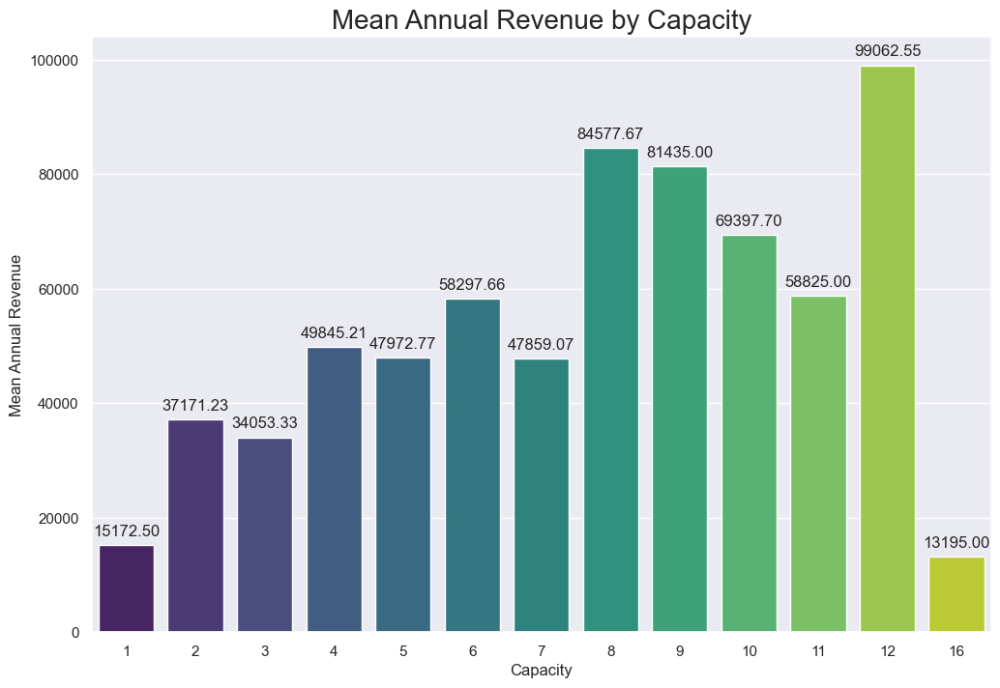

In [21]:
# Calculate mean annual revenue for all accommodations
hobart_df['annual_revenue'] = hobart_df['price_x'] * 365 * hobart_df['occupancy_rate']
mean_annual_revenue = hobart_df.groupby('accommodates')['annual_revenue'].mean().reset_index()

plt.figure(figsize=(12, 8))
ax = sns.barplot(data=mean_annual_revenue, x='accommodates', y='annual_revenue', palette='viridis')
plt.title('Mean Annual Revenue by Capacity', fontsize=20)
plt.xlabel('Capacity', fontsize=12)
plt.ylabel('Mean Annual Revenue', fontsize=12)
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.show()


# Precio medio de la vivienda en Hobart

Este script realiza un análisis exploratorio de datos (EDA) sobre el precio medio de la vivienda y el tiempo necesario para amortizarla en función de los ingresos anuales promedio. Además, filtra los datos para excluir habitaciones de hotel y valores atípicos, calcula el ingreso anual promedio y genera una gráfica de línea que compara el precio de la vivienda con el ingreso anual acumulado a lo largo de 20 años.
Funciones principales:
1. Calcular el tiempo necesario para amortizar una vivienda con un precio medio dado.
2. Filtrar los datos para excluir habitaciones de hotel y valores atípicos.
3. Calcular el ingreso anual promedio basado en los datos filtrados.
4. Generar una gráfica de línea que muestra la comparación entre el precio de la vivienda y el ingreso anual acumulado durante 20 años.
Variables:
- precio_vivienda: Precio medio de la vivienda.
- mean_annual_revenue_overall: Ingreso anual promedio general.
- tiempo_amortizacion: Tiempo necesario para amortizar la vivienda.
- filtered_data: Datos filtrados para excluir habitaciones de hotel y valores atípicos.
- annual_revenue: Ingreso anual promedio basado en los datos filtrados.
- years: Lista de años (1 a 20).
- cumulative_revenue: Ingreso acumulado por año.
Gráfica:
- Una gráfica de línea que muestra la comparación entre el precio de la vivienda y el ingreso anual acumulado durante 20 años.
precio_vivienda = 347000

##### fuente : https://australatinos.com/comprar-casa-en-australia/

El tiempo necesario para amortizar una vivienda con un precio medio de $347,000 es de aproximadamente 6.47 años.


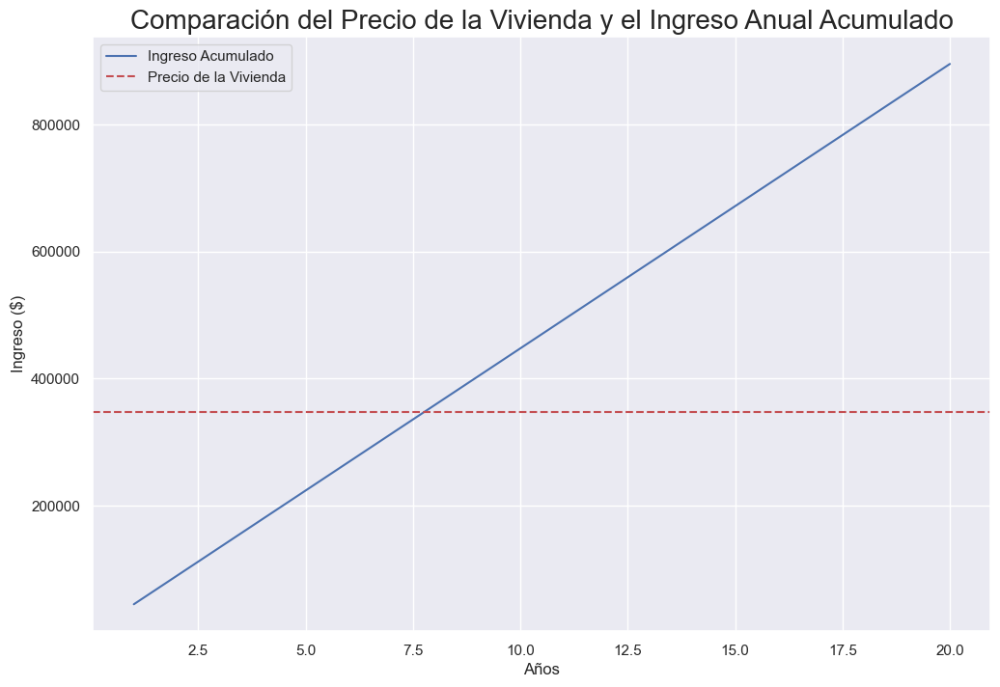

In [29]:
precio_vivienda = 347000
mean_annual_revenue_overall = mean_annual_revenue['annual_revenue'].mean()
tiempo_amortizacion = precio_vivienda / mean_annual_revenue_overall

print(f"El tiempo necesario para amortizar una vivienda con un precio medio de $347,000 es de aproximadamente {tiempo_amortizacion:.2f} años.")

filtered_data = hobart_df[(hobart_df['room_type'] != 'Hotel room') & (hobart_df['price_x'] < hobart_df['price_x'].quantile(0.95))]
annual_revenue = filtered_data['price_x'].mean() * 365 * occupancy_rate
years = np.arange(1, 21)
cumulative_revenue = np.cumsum([annual_revenue] * 20)

#grafica
plt.figure(figsize=(12, 8))
plt.plot(years, cumulative_revenue, label='Ingreso Acumulado')
plt.axhline(y=precio_vivienda, color='r', linestyle='--', label='Precio de la Vivienda')
plt.title('Comparación del Precio de la Vivienda y el Ingreso Anual Acumulado', fontsize=20)
plt.xlabel('Años', fontsize=12)
plt.ylabel('Ingreso ($)', fontsize=12)
plt.legend()
plt.show()

# Caso real de compra de vivienda
West Moonah, Unit 1/3 Bermuka Street ( Glenorchy ) <br>
Casa • 2 habitación/es • 2 dormitorios • 1 baño. • ref.: 5R3MFCS <br>
Offers Over $375,000
link : https://www.properstar.es/vivienda/96462514

In [30]:
glenorchy_df = df[df['neighbourhood'] == 'Glenorchy']

map_glenorchy = folium.Map(location=[-42.8333, 147.2750], zoom_start=12)
colormap = LinearColormap(colors=['green', 'yellow', 'red'], vmin=0, vmax=2, caption='Price Category')
colormap = colormap.to_step(index=[0, 1, 2])

for idx, row in glenorchy_df.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=5,
        color=colormap(row['price_category_code']),
        fill=True,
        fill_color=colormap(row['price_category_code']),
        fill_opacity=0.7,
        popup=f"Price: {row['price_x']}<br>Price Category: {row['price_category']}"
    ).add_to(map_glenorchy)

colormap.add_to(map_glenorchy)

map_glenorchy

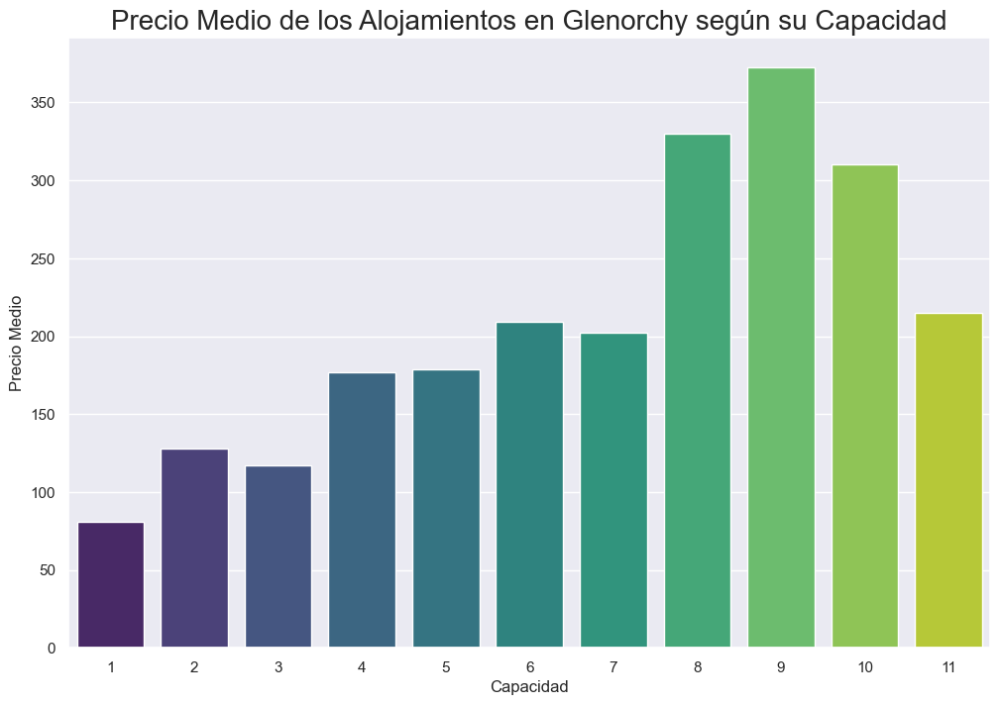

In [ ]:
glenorchy_capacity_price = glenorchy_df.groupby('accommodates')['price_x'].mean().reset_index()

plt.figure(figsize=(12, 8))
sns.barplot(data=glenorchy_capacity_price, x='accommodates', y='price_x', palette='viridis')
plt.title('Precio Medio de los Alojamientos en Glenorchy según su Capacidad', fontsize=20)
plt.xlabel('Capacidad', fontsize=12)
plt.ylabel('Precio Medio', fontsize=12)
plt.show()

## Tiempo de amortizacion y benefico



El tiempo necesario para amortizar una vivienda con un precio medio de $375,000 es de aproximadamente 7.00 años.


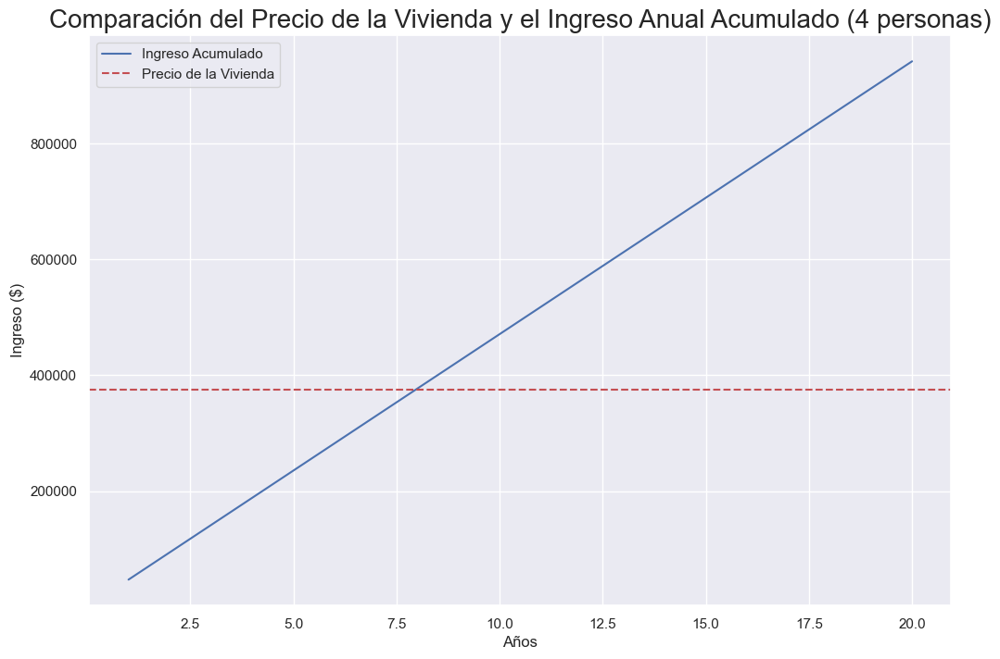

In [23]:
precio_vivienda = 375000
mean_annual_revenue_overall = mean_annual_revenue['annual_revenue'].mean()
tiempo_amortizacion = precio_vivienda / mean_annual_revenue_overall

print(f"El tiempo necesario para amortizar una vivienda con un precio medio de $375,000 es de aproximadamente {tiempo_amortizacion:.2f} años.")

filtered_data = hobart_df[(hobart_df['room_type'] != 'Hotel room') & 
                          (hobart_df['price_x'] < hobart_df['price_x'].quantile(0.95)) & 
                          (hobart_df['accommodates'] == 4)]
annual_revenue = filtered_data['price_x'].mean() * 365 * occupancy_rate
years = np.arange(1, 21)
cumulative_revenue = np.cumsum([annual_revenue] * 20)

#grafica
plt.figure(figsize=(12, 8))
plt.plot(years, cumulative_revenue, label='Ingreso Acumulado')
plt.axhline(y=precio_vivienda, color='r', linestyle='--', label='Precio de la Vivienda')
plt.title('Comparación del Precio de la Vivienda y el Ingreso Anual Acumulado (4 personas)', fontsize=20)
plt.xlabel('Años', fontsize=12)
plt.ylabel('Ingreso ($)', fontsize=12)
plt.legend()
plt.show()